In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.cuda
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms
import os
from joblib import dump, load
from PIL import Image
from tqdm.notebook import tqdm
from torch.nn.functional import relu
from torch.utils.data import DataLoader, Dataset
from SHG import SHG
from utils import *
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.base import clone
from sklearn.preprocessing import StandardScaler
from utils import *

In [2]:
""" PATHS """
# Bottleneck data path
DATA_PATH_FULL = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/SHG_AE/latent_space/full/" # Only full skeletons
DATA_PATH_ALL = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/SHG_AE/latent_space/all/" # all skeletons

# Ground truth heatmaps
HEATMAPS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/heatmaps/"

# Saving path
SAVING_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/"

In [3]:
""" LOADING DATA - FULL SKELETONS """
X, y, IDs = load_data(DATA_PATH_FULL, HEATMAPS_PATH)
X = np.array(X).reshape((len(X), X[0].shape[0]))

KeyboardInterrupt: 

Silhouette score for k = 2: 0.14696191251277924
Silhouette score for k = 3: 0.1474381983280182
Silhouette score for k = 4: 0.13636809587478638
Silhouette score for k = 5: 0.13837593793869019
Silhouette score for k = 6: 0.1370793581008911
Silhouette score for k = 7: 0.13562361896038055
Silhouette score for k = 8: 0.14135314524173737
Silhouette score for k = 9: 0.14460036158561707
Silhouette score for k = 10: 0.14539363980293274


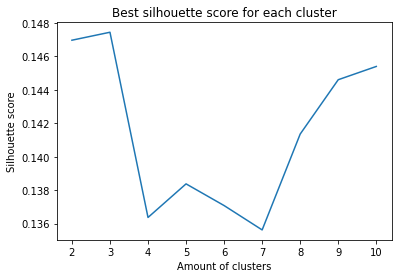

In [4]:
""" First we run KMeans on all of the data"""
kmeans_full_model, centroids_full, labels = get_kmeans_alternative(StandardScaler().fit_transform(X), max_k = 10)

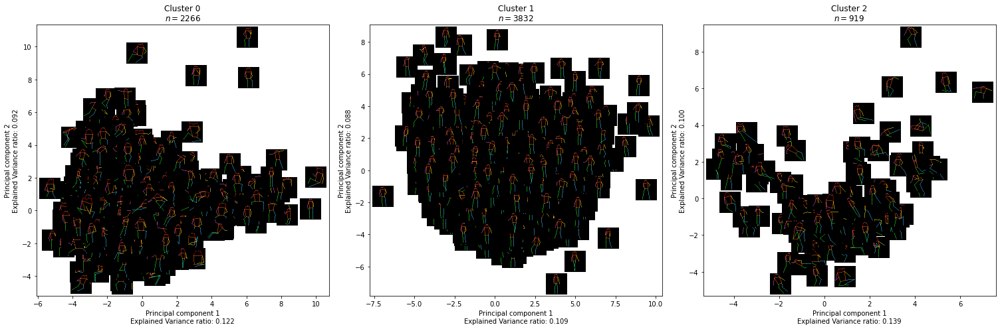

In [5]:
""" Visualizing the clusters with PCA"""
visualize_clusters_pca(X, y, kmeans_full_model.labels_, fig_size = (21, 7))

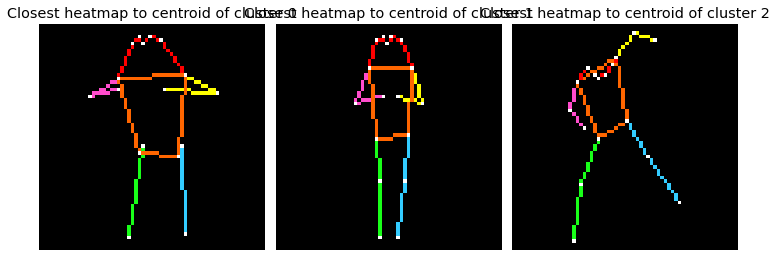

In [6]:
""" Finding gt heatmaps of centroids """
centroids_indices = []
centroids_gt_heatmaps = []

# Finding the indices
for centroid in centroids_full:
    for i, x in enumerate(StandardScaler().fit_transform(X)):
        if (x == centroid).all():
            centroids_indices.append(i)
            break

# Finding the gt heatmaps
for i in centroids_indices:
    centroids_gt_heatmaps.append(y[i])

# Showing and saving centroids
fig, axs = plt.subplots(1, 3, figsize = (10, 10))
for i, centroid in enumerate(centroids_gt_heatmaps):
    axs[i].imshow(draw_skeleton(turn_featuremaps_to_keypoints(centroid)))
    axs[i].set_title("Closest heatmap to centroid of cluster {}".format(i), size = "x-large")
    axs[i].axis("off")

plt.tight_layout()
#plt.savefig(FIG_SAVING_PATH + "centroids_full_skeletons.png")
plt.show()

Silhouette score for k = 2: 0.14696191251277924


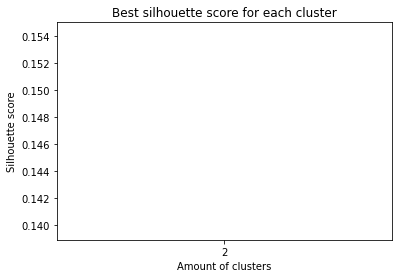

In [7]:
""" Visualization with k = 2 """
kmeans_full_model, centroids_full, labels = get_kmeans_alternative(StandardScaler().fit_transform(X), max_k = 2)

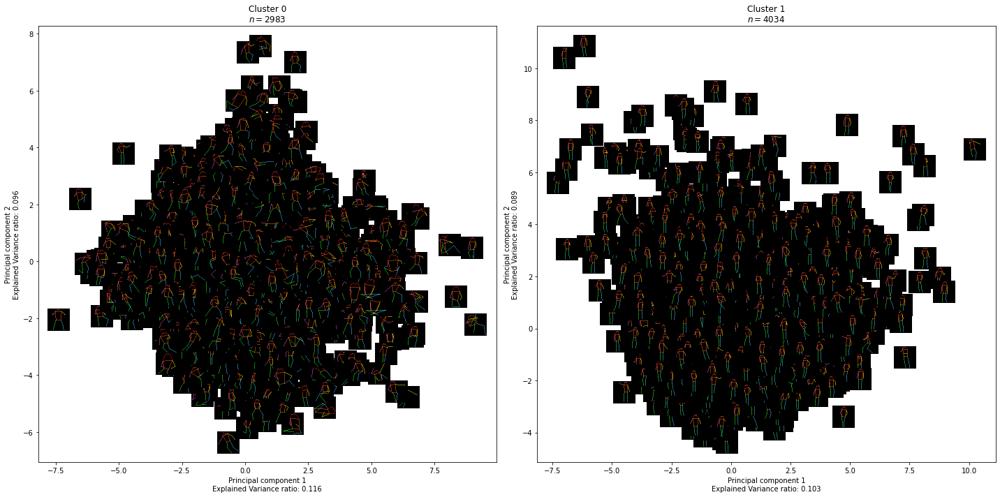

In [8]:
""" Visualizing the clusters with PCA"""
visualize_clusters_pca(X, y, kmeans_full_model.labels_, fig_size = (20, 10))

In [3]:
""" LOADING DATA - All SKELETONS """
X, y, IDs = load_data(DATA_PATH_ALL, HEATMAPS_PATH, 10000)
X = np.array(X).reshape((len(X), X[0].shape[0]))

Silhouette score for k = 2: 0.14921827614307404
Silhouette score for k = 3: 0.16286173462867737
Silhouette score for k = 4: 0.15812350809574127
Silhouette score for k = 5: 0.09312363713979721
Silhouette score for k = 6: 0.09845152497291565
Silhouette score for k = 7: 0.09266482293605804
Silhouette score for k = 8: 0.10208631306886673
Silhouette score for k = 9: 0.10904062539339066
Silhouette score for k = 10: 0.11076115816831589


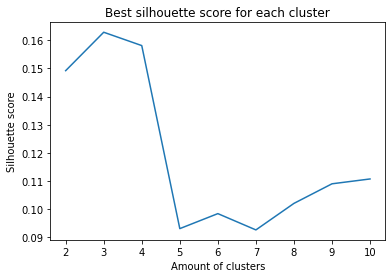

In [4]:
""" First we run KMeans on all of the data"""
kmeans_full_model, centroids_full, labels = get_kmeans_alternative(StandardScaler().fit_transform(X), max_k = 10)

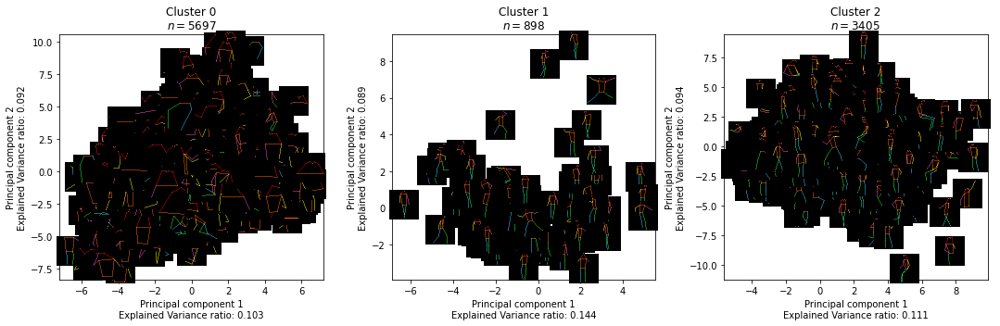

In [5]:
""" Visualizing the clusters with PCA"""
visualize_clusters_pca(X, y, kmeans_full_model.labels_, fig_size = (21, 7))

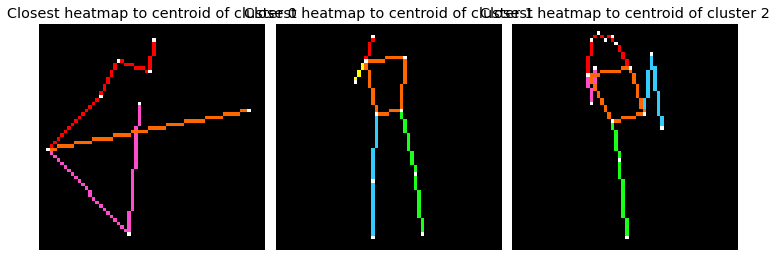

In [6]:
""" Finding gt heatmaps of centroids """
centroids_indices = []
centroids_gt_heatmaps = []

# Finding the indices
for centroid in centroids_full:
    for i, x in enumerate(StandardScaler().fit_transform(X)):
        if (x == centroid).all():
            centroids_indices.append(i)
            break

# Finding the gt heatmaps
for i in centroids_indices:
    centroids_gt_heatmaps.append(y[i])

# Showing and saving centroids
fig, axs = plt.subplots(1, 3, figsize = (10, 10))
for i, centroid in enumerate(centroids_gt_heatmaps):
    axs[i].imshow(draw_skeleton(turn_featuremaps_to_keypoints(centroid)))
    axs[i].set_title("Closest heatmap to centroid of cluster {}".format(i), size = "x-large")
    axs[i].axis("off")

plt.tight_layout()
#plt.savefig(FIG_SAVING_PATH + "centroids_full_skeletons.png")
plt.show()

Silhouette score for k = 2: 0.14921827614307404


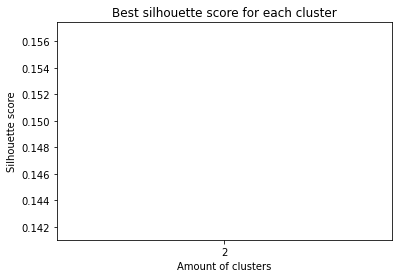

In [7]:
""" Visualization with k = 2 """
kmeans_full_model, centroids_full, labels = get_kmeans_alternative(StandardScaler().fit_transform(X), max_k = 2)

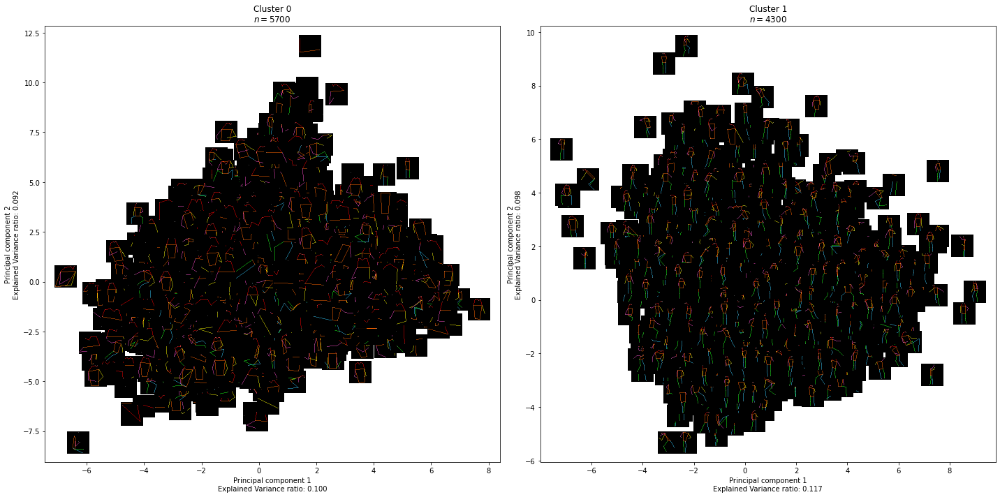

In [9]:
""" Visualizing the clusters with PCA"""
visualize_clusters_pca(X, y, kmeans_full_model.labels_, fig_size = (20, 10), fig_saving_path = SAVING_PATH)